In [1]:
import csv
import numpy as np
from typing import Set,Tuple, List
import torch
import torch.utils
import torch.utils.data
import torch.nn as nn
import torchvision
NoneType = type(None)
import matplotlib.pyplot as plt
from IPython.display import display, clear_output
from PIL import Image
import torchvision.transforms.functional as TF
from torchvision.models import vgg11
from torchvision.models import mobilenet_v2
import torchvision.transforms as transforms
import time


# **Exercise 1**

This method returns the fruit name by getting the string at a specific index of the set.

param fruit_id
The id of the fruit to get

param fruits
The set of fruits to choose the id from

return
The string corrosponding to the index fruit_id

This method is part of a series of debugging exercises. Each Python method of this series contains bug that needs to be found.

1. It does not print the fruit at the correct index, why is the returned result wrong?

Ans: The method does not return the correct fruit because sets in Python are unordered. When iterating over a set, the order of elements is arbitrary, meaning that the indices assigned during iteration are inconsistent. As a result, fruit_id does not correctly map to the expected fruit.
2. How could this be fixed?

Ans: The issue can be fixed by converting the set to a sorted list before indexing. Lists maintain order, ensuring that fruit_id correctly corresponds to a specific fruit.
This example demonstrates the issue: name1, name3 and name4 are expected to correspond to the strings at the indices 1, 3, and 4: 'orange', 'kiwi' and 'strawberry'..

In [2]:
from typing import Set

def id_to_fruit(fruit_id: int, fruits: Set[str]) -> str:
    """
    This method returns the fruit name by getting the string at a specific index of the set.
    :param fruit_id: The id of the fruit to get
    :param fruits: The set of fruits to choose the id from
    :return: The string corresponding to the index `fruit_id`
    """
    sorted_fruits = sorted(fruits)  # Convert set to a sorted list
    if 0 <= fruit_id < len(sorted_fruits):
        return sorted_fruits[fruit_id]  # Access by index
    raise RuntimeError(f"Fruit with id {fruit_id} does not exist")

In [3]:
# Test cases
name1 = id_to_fruit(1, {"apple", "orange", "melon", "kiwi", "strawberry"})
name3 = id_to_fruit(3, {"apple", "orange", "melon", "kiwi", "strawberry"})
name4 = id_to_fruit(4, {"apple", "orange", "melon", "kiwi", "strawberry"})

print(name1)  # Expected: 'kiwi'
print(name3)  # Expected: 'strawberry'
print(name4)  # Expected: 'orange'

kiwi
orange
strawberry


# **Exercise 2**

This method will flip the x and y coordinates in the coords array.

param coords
A numpy array of bounding box coordinates with shape [n,5] in format: :

[[x11, y11, x12, y12, classid1],
 [x21, y21, x22, y22, classid2],
 ...
 [xn1, yn1, xn2, yn2, classid3]]
return
The new numpy array where the x and y coordinates are flipped.

This method is part of a series of debugging exercises. Each Python method of this series contains bug that needs to be found.

1. Can you spot the obvious error?

Ans: Yes, the obvious error is in this line: coords[:, 0], coords[:, 1], coords[:, 2], coords[:, 3] = coords[:, 1], coords[:, 1], coords[:, 3], coords[:, 2] The issue is that coords[:, 1] is assigned twice, causing data loss. Instead of swapping correctly, this overwrites values incorrectly.

2. After fixing the obvious error it is still wrong, how can this be fixed?

Ans: Even after correcting the assignment, the function modifies the input array in place, which might not be intended. Instead, it should return a new array without modifying the original.

The example demonstrates the issue. The returned swapped_coords are expected to have swapped x and y coordinates in each of the rows.

In [4]:
import numpy as np

def swap(coords: np.ndarray) -> np.ndarray:
    """
    This method flips the x and y coordinates in the coords array.

    :param coords: A numpy array of bounding box coordinates with shape [n,5]
    :return: A new numpy array where x and y coordinates are flipped.
    """
    swapped = coords.copy()  # Create a copy to avoid modifying the original
    swapped[:, [0, 1, 2, 3]] = swapped[:, [1, 0, 3, 2]]  # Swap x and y coordinates
    return swapped

In [5]:
coords = np.array([[10, 5, 15, 6, 0],
                   [11, 3, 13, 6, 0],
                   [5, 3, 13, 6, 1],
                   [4, 4, 13, 6, 1],
                   [6, 5, 13, 16, 1]])

swapped_coords = swap(coords)
print(swapped_coords)

[[ 5 10  6 15  0]
 [ 3 11  6 13  0]
 [ 3  5  6 13  1]
 [ 4  4  6 13  1]
 [ 5  6 16 13  1]]


# **Exercise 3**

This code plots the precision-recall curve based on data from a .csv file, where precision is on the x-axis and recall is on the y-axis. It it not so important right now what precision and recall means.

param csv_file_path
The CSV file containing the data to plot.

This method is part of a series of debugging exercises. Each Python method of this series contains bug that needs to be found.

1. For some reason the plot is not showing correctly, can you find out what is going wrong?

Ans: The issue lies in this line: results = np.stack(results) csv.reader returns data as strings, so results contains string values instead of numerical values. np.stack() does not convert them into floats, which can lead to incorrect plotting. Another issue is in the plotting order: plt.plot(results[:, 1], results[:, 0]) Recall should be on the x-axis and Precision should be on the y-axis, but the indices are reversed.

2. How could this be fixed?

Ans: Convert the values in results to floats before using NumPy operations. Ensure correct indexing for precision (y-axis) and recall (x-axis)
This example demonstrates the issue. It first generates some data in a csv file format and the plots it using the plot_data method. If you manually check the coordinates and then check the plot, they do not correspond.

In [6]:
import csv
import numpy as np
import matplotlib.pyplot as plt

def plot_data(csv_file_path: str):
    """
    This function correctly plots the precision-recall curve.
    """
    # Load data correctly
    results = []
    with open(csv_file_path) as result_csv:
        csv_reader = csv.reader(result_csv, delimiter=',')
        next(csv_reader)  # Skip header
        for row in csv_reader:
            results.append([float(row[0]), float(row[1])])  # Convert to float

    results = np.array(results)  # Convert to NumPy array

    # Plot precision-recall curve with correct axis mapping
    plt.plot(results[:, 0], results[:, 1])  # Precision (x) vs Recall (y)
    plt.ylim([-0.05, 1.05])
    plt.xlim([-0.05, 1.05])
    plt.xlabel('Precision')  # Correct label
    plt.ylabel('Recall')  # Correct label
    plt.title('Precision-Recall Curve')
    plt.grid(True)
    plt.show()

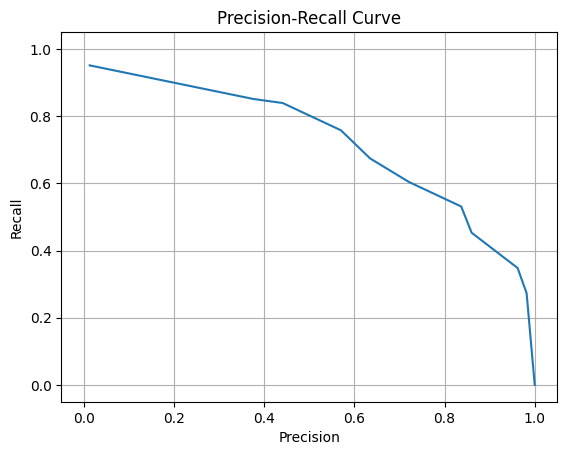

In [7]:
f = open("data_file.csv", "w", newline='')
w = csv.writer(f)
_ = w.writerow(["precision", "recall"])
w.writerows([[0.013, 0.951],
             [0.376, 0.851],
             [0.441, 0.839],
             [0.570, 0.758],
             [0.635, 0.674],
             [0.721, 0.604],
             [0.837, 0.531],
             [0.860, 0.453],
             [0.962, 0.348],
             [0.982, 0.273],
             [1.0, 0.0]])
f.close()
plot_data('data_file.csv')

# Generator (for Exercise 4)

### Generator class for the GAN

In [8]:
import torch
import torch.nn as nn

class Generator(nn.Module):
    """
    Generator class for the GAN
    """

    def __init__(self):
        super().__init__()
        self.model = nn.Sequential(
            nn.Linear(100, 256),
            nn.ReLU(),
            nn.Linear(256, 512),
            nn.ReLU(),
            nn.Linear(512, 1024),
            nn.ReLU(),
            nn.Linear(1024, 784),
            nn.Tanh(),
        )

    def forward(self, x):
        output = self.model(x)
        output = output.view(x.size(0), 1, 28, 28)
        return output


# **Discriminator (for Exercise 4)**

## Discriminator class for the GAN

In [19]:
# You can copy this code to your personal pipeline project or execute it here.
class Discriminator(nn.Module):
    """
    Discriminator class for the GAN
    """
    def __init__(self):
        super().__init__()
        self.model = nn.Sequential(
            nn.Linear(784, 1024),
            nn.ReLU(),
            nn.Dropout(0.3),
            nn.Linear(1024, 512),
            nn.ReLU(),
            nn.Dropout(0.3),
            nn.Linear(512, 256),
            nn.ReLU(),
            nn.Dropout(0.3),
            nn.Linear(256, 1),
            nn.Sigmoid(),
        )

    def forward(self, x):
        x = x.view(x.size(0), 784)
        output = self.model(x)
        return output



# **Exercise 4**

The method trains a Generative Adversarial Network and is based on: https://realpython.com/generative-adversarial-networks/

The Generator network tries to generate convincing images of handwritten digits. The Discriminator needs to detect if the image was created by the Generater or if the image is a real image from a known dataset (MNIST). If both the Generator and the Discriminator are optimized, the Generator is able to create images that are difficult to distinguish from real images. This is goal of a GAN.

This code produces the expected results at first attempt at about 50 epochs.

param batch_size
The number of images to train in one epoch.

param num_epochs
The number of epochs to train the gan.

param device
The computing device to use. If CUDA is installed and working then cuda:0 is chosen otherwise 'cpu' is chosen. Note: Training a GAN on the CPU is very slow.

This method is part of a series of debugging exercises. Each Python method of this series contains bug that needs to be found.

It contains at least two bugs: one structural bug and one cosmetic bug. Both bugs are from the original tutorial.

1. Changing the batch_size from 32 to 64 triggers the structural bug.

Ans: The issue is with the batch sizes of the real and generated samples when training the discriminator. The batch_size is used to generate random noise for the generator and to create real sample labels. However, when combining real and generated samples, their count might not match due to dataset size not being perfectly divisible by batch_size. This results in a size mismatch error, especially when changing the batch size to 64.

2. Can you also spot the cosmetic bug?


Ans: Yes, the cosmetic bug is in the plot title formatting, where loss values are displayed without clear separators, making them less readable.

Note: to fix this bug a thorough understanding of GANs is not necessary.

Change the batch size to 64 to trigger the bug with message: ValueError: "Using a target size (torch.Size([128, 1])) that is different to the input size (torch.Size([96, 1])) is deprecated. Please ensure they have the same size."

In [9]:
import torch
import torch.nn as nn
import torchvision
import torchvision.transforms as transforms
import matplotlib.pyplot as plt
import time
from IPython.display import display, clear_output

# Define the Generator and Discriminator classes (ensure they are properly defined in your code)
class Generator(nn.Module):
    def __init__(self):
        super(Generator, self).__init__()
        self.model = nn.Sequential(
            nn.Linear(100, 256),
            nn.ReLU(),
            nn.Linear(256, 512),
            nn.ReLU(),
            nn.Linear(512, 1024),
            nn.ReLU(),
            nn.Linear(1024, 28 * 28),
            nn.Tanh()
        )

    def forward(self, x):
        return self.model(x).view(-1, 1, 28, 28)

class Discriminator(nn.Module):
    def __init__(self):
        super(Discriminator, self).__init__()
        self.model = nn.Sequential(
            nn.Linear(28 * 28, 512),
            nn.ReLU(),
            nn.Linear(512, 256),
            nn.ReLU(),
            nn.Linear(256, 1),
            nn.Sigmoid()
        )

    def forward(self, x):
        return self.model(x.view(-1, 28 * 28))


def train_gan(batch_size: int = 32, num_epochs: int = 100, device: str = "cuda:0" if torch.cuda.is_available() else "cpu"):
    """
    The method trains a Generative Adversarial Network and is based on:
    https://realpython.com/generative-adversarial-networks/

    The Generator network tries to generate convincing images of handwritten digits.
    The Discriminator needs to detect if the image was created by the Generator or if the image is a real image from
    a known dataset (MNIST).

    This code produces the expected results at first attempt at about 50 epochs.
    """

    transform = transforms.Compose([transforms.ToTensor(), transforms.Normalize((0.5,), (0.5,))])

    try:
        train_set = torchvision.datasets.MNIST(root=".", train=True, download=True, transform=transform)
    except Exception as e:
        print(f"Failed to download MNIST: {e}")
        torchvision.datasets.MNIST.resources = [
            ('https://ossci-datasets.s3.amazonaws.com/mnist/train-images-idx3-ubyte.gz',
             'f68b3c2dcbeaaa9fbdd348bbdeb94873'),
            ('https://ossci-datasets.s3.amazonaws.com/mnist/train-labels-idx1-ubyte.gz',
             'd53e105ee54ea40749a09fcbcd1e9432'),
            ('https://ossci-datasets.s3.amazonaws.com/mnist/t10k-images-idx3-ubyte.gz',
             '9fb629c4189551a2d022fa330f9573f3'),
            ('https://ossci-datasets.s3.amazonaws.com/mnist/t10k-labels-idx1-ubyte.gz',
             'ec29112dd5afa0611ce80d1b7f02629c')
        ]
        train_set = torchvision.datasets.MNIST(root=".", train=True, download=True, transform=transform)

    train_loader = torch.utils.data.DataLoader(train_set, batch_size=batch_size, shuffle=True)

    # Set up training
    discriminator = Discriminator().to(device)
    generator = Generator().to(device)
    lr = 0.0001
    loss_function = nn.BCELoss()
    optimizer_discriminator = torch.optim.Adam(discriminator.parameters(), lr=lr)
    optimizer_generator = torch.optim.Adam(generator.parameters(), lr=lr)

    # Training loop
    for epoch in range(num_epochs):
        for n, (real_samples, _) in enumerate(train_loader):

            # Fix batch size mismatch issue
            real_samples = real_samples.to(device=device)
            batch_size_actual = real_samples.size(0)
            real_samples_labels = torch.ones((batch_size_actual, 1)).to(device=device)
            latent_space_samples = torch.randn((batch_size_actual, 100)).to(device=device)
            generated_samples = generator(latent_space_samples)
            generated_samples_labels = torch.zeros((batch_size_actual, 1)).to(device=device)
            all_samples = torch.cat((real_samples, generated_samples))
            all_samples_labels = torch.cat((real_samples_labels, generated_samples_labels))

            # Train the discriminator
            discriminator.zero_grad()
            output_discriminator = discriminator(all_samples)
            loss_discriminator = loss_function(output_discriminator, all_samples_labels)
            loss_discriminator.backward()
            optimizer_discriminator.step()

            # Train the generator
            generator.zero_grad()
            latent_space_samples = torch.randn((batch_size_actual, 100)).to(device=device)
            generated_samples = generator(latent_space_samples)
            output_discriminator_generated = discriminator(generated_samples)
            loss_generator = loss_function(output_discriminator_generated, real_samples_labels)
            loss_generator.backward()
            optimizer_generator.step()

            # Show loss and generated samples
            if n == len(train_loader) - 1:
                name = f"Generated images\nEpoch: {epoch}\nLoss D.: {loss_discriminator:.2f}, Loss G.: {loss_generator:.2f}"
                generated_samples = generated_samples.detach().cpu().numpy()
                fig = plt.figure()
                for i in range(16):
                    sub = fig.add_subplot(4, 4, 1 + i)
                    sub.imshow(generated_samples[i].reshape(28, 28), cmap="gray_r")
                    sub.axis('off')
                fig.suptitle(name)
                fig.tight_layout()
                clear_output(wait=False)
                display(fig)

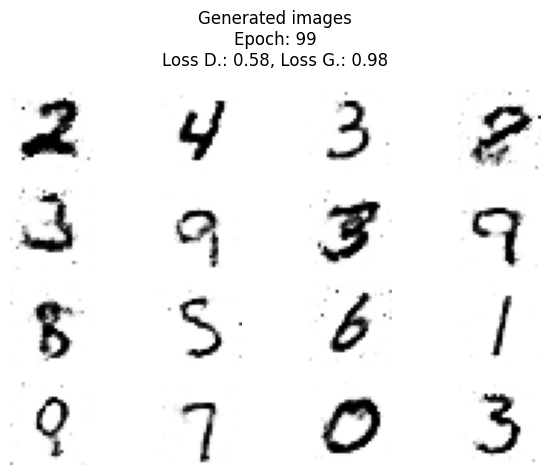

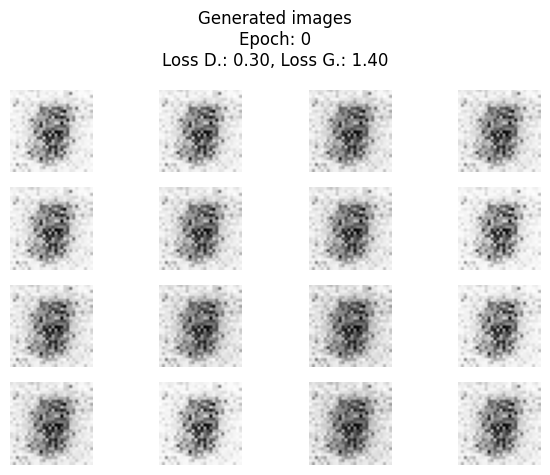

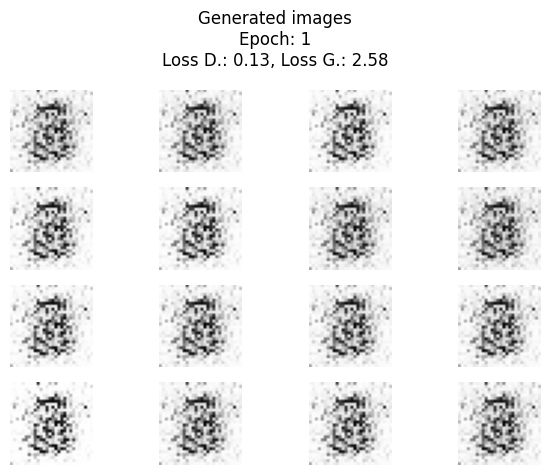

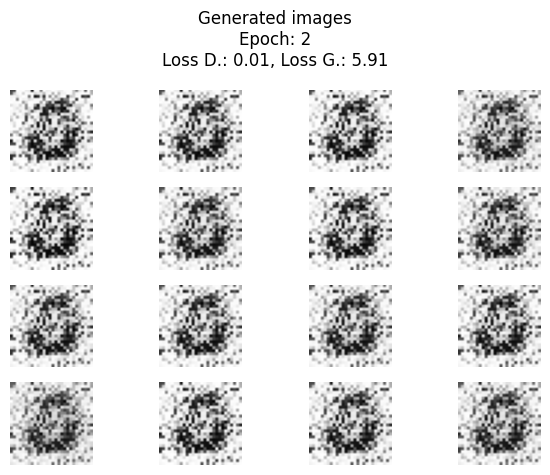

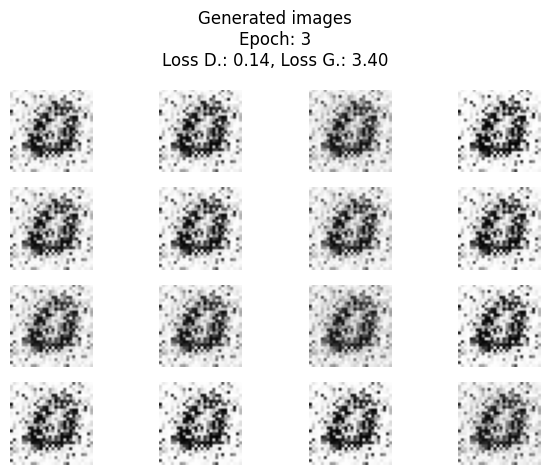

...

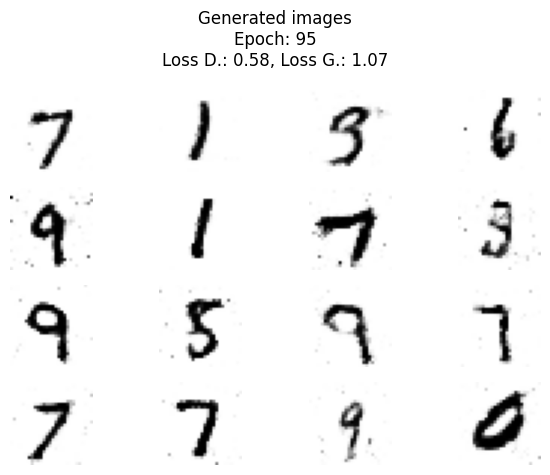

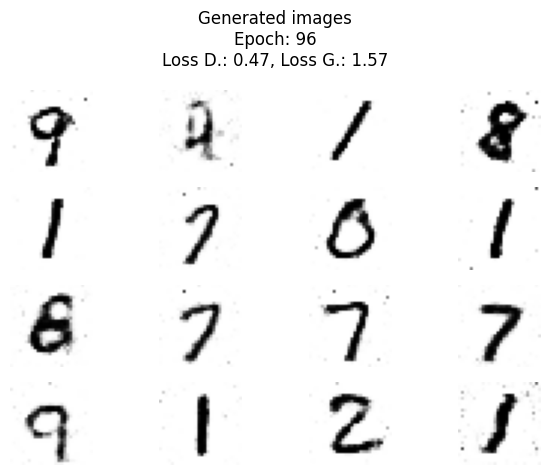

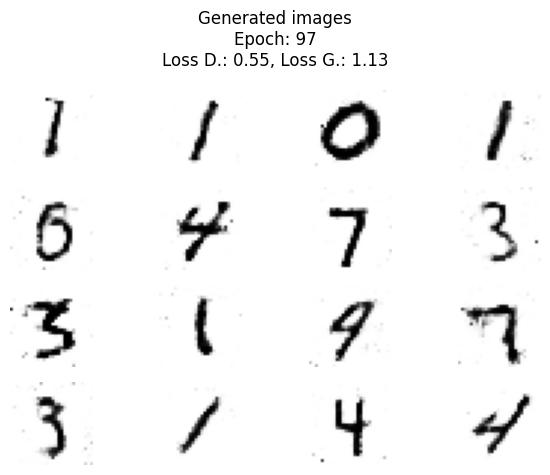

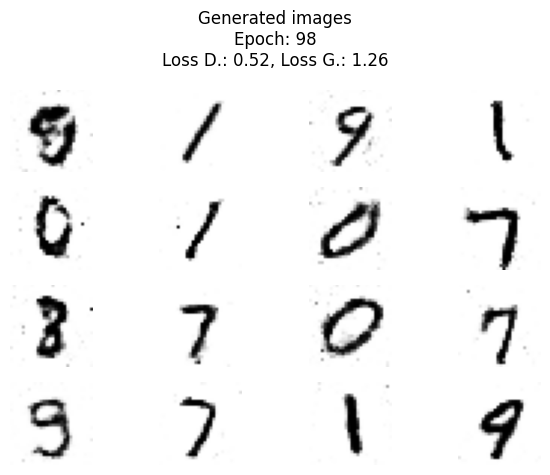

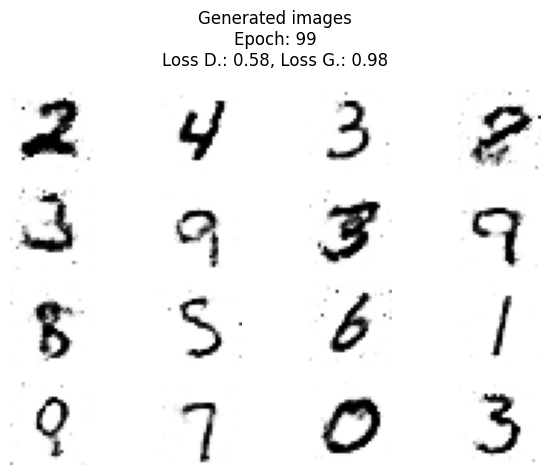

In [10]:
train_gan(batch_size=32, num_epochs=100)